# **FOTS: Fast Oriented Text Spotting**


## **Importing Libraries**

In [ ]:
# mandatory libraries
import os
import numpy as np
import pandas as pd

#plotting libraries
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches

#computer vision libraries
import cv2

#file extracting libraries
from zipfile import ZipFile
import scipy.io

#miscellaneous libraries
import warnings
warnings.filterwarnings("ignore")
from tqdm.notebook import tqdm
import joblib
from scipy import stats

## **Mounting Google Drive**

In [ ]:
#mounting google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## **Downloading Datasets**

### **ICDAR-15**

In [ ]:
!wget --header="Host: rrc.cvc.uab.es" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://rrc.cvc.uab.es/?ch=4&com=downloads" --header="Cookie: _ga=GA1.2.269986937.1624706527; PHPSESSID=mbdov6dmu2bkdu1kkgdn41f8c2; _gid=GA1.2.1278905833.1625080724; _gat=1" --header="Connection: keep-alive" "https://rrc.cvc.uab.es/downloads/ch4_training_images.zip" --no-check-certificate -c -O 'ch4_training_images.zip'

--2023-05-10 09:08:04--  https://rrc.cvc.uab.es/downloads/ch4_training_images.zip
Resolving rrc.cvc.uab.es (rrc.cvc.uab.es)... 158.109.8.55
Connecting to rrc.cvc.uab.es (rrc.cvc.uab.es)|158.109.8.55|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 90667586 (86M) [application/zip]
Saving to: ‘ch4_training_images.zip’

ch4_training_images 100%[===================>]  86.47M  7.75MB/s    in 25s     

2023-05-10 09:08:30 (3.40 MB/s) - ‘ch4_training_images.zip’ saved [90667586/90667586]



In [ ]:
!wget --header="Host: rrc.cvc.uab.es" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://rrc.cvc.uab.es/?ch=4&com=downloads" --header="Cookie: _ga=GA1.2.269986937.1624706527; PHPSESSID=mbdov6dmu2bkdu1kkgdn41f8c2; _gid=GA1.2.1278905833.1625080724" --header="Connection: keep-alive" "https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip" --no-check-certificate -c -O 'ch4_training_localization_transcription_gt.zip'

--2023-05-10 09:08:31--  https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip
Resolving rrc.cvc.uab.es (rrc.cvc.uab.es)... 158.109.8.55
Connecting to rrc.cvc.uab.es (rrc.cvc.uab.es)|158.109.8.55|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 344624 (337K) [application/zip]
Saving to: ‘ch4_training_localization_transcription_gt.zip’

ch4_training_locali 100%[===================>] 336.55K   324KB/s    in 1.0s    

2023-05-10 09:08:32 (324 KB/s) - ‘ch4_training_localization_transcription_gt.zip’ saved [344624/344624]



## **Pre-processing**

### **ICDAR-15**

1)ICDAR-2015 Dataset is a real world dataset having images from wearable camera.

2) This dataset consists of 1000 train-set images & 500 test-set images  which are blurry & less focus on the text and less legible.

3) Building a model to recognize text from less legible images is quite challenging.

4) Considering a deep-learning model training, 1000 images are very less in number

#### **Ground Truths**

1) ICDAR-2015 dataset authors provided ground truths in .txt file i.e each image have its corresponding ground truth .txt file

2) Each image contains multiple text labels(seperated by new line char). Ground truth files contains all the text labels present in the image and bounding box co-ordinates for each text label.

3) Format of the annotation as follows...

    "x1,y1,x2,y2,x3,y3,x4,y4,textlabel/n"

4 vertices of the bounding-box, followed by text label


4) some of the text which is not clear or chinese text in the images are annotated as ###, which need to be ignored during training & loss/metric calculations

In [ ]:
#getting all list of file names present in the .zip file
data=!unzip -l ./ch4_training_localization_transcription_gt.zip

In [ ]:
#getting only .txt files
txt_file_names=[]
for i in data:
  if (i.endswith(".txt")):
    txt_file_names.append(i)

In [ ]:
#should be same as no:of images
print("No:of .txt files in ICDAR-15 dataset = ",len(txt_file_names))

No:of .txt files in ICDAR-15 dataset =  1000


In [ ]:
#random check
txt_file_names[0]

'      275  2015-03-12 13:06   gt_img_1.txt'

In [ ]:
#getting only required part of file name
txt_file_names=[i.split()[-1] for i in txt_file_names]

In [ ]:
#random check
txt_file_names[5:8]

['gt_img_6.txt', 'gt_img_7.txt', 'gt_img_8.txt']

In [ ]:
#zipfile object to extract the required files from .zip file
file_name="/content/ch4_training_localization_transcription_gt.zip"
zpfile=ZipFile(file_name,'r')

In [ ]:
#loop to get all the ground truths i.e bounding box, text labels -
#present in the each image
data=[]
for txt_file in tqdm(txt_file_names):
    img_name=txt_file[3:].replace(".txt",".jpg")
    zpfile.extract(txt_file)
    with open(txt_file,'r',encoding='utf-8-sig') as f:
        lines=f.readlines()
        bbox_cords=[]
        labels=[]
        for line in lines:
            label=",".join(line.split(",")[8:])[0:-1] 
            #logic to handle "," present in text label.check out gt_img_39.txt
            co_ords=line.split(",")[0:8]
            co_ord_pair=np.array([(float(co_ords[i]),float(co_ords[i+1]))\
                                  for i in range(0,len(co_ords),2)])
            bbox_cords.append(co_ord_pair)
            labels.append(label)
        bbox_cords=np.array(bbox_cords)
        labels=np.array(labels)
    os.remove(txt_file)
    data.append([img_name,txt_file,bbox_cords,labels])
zpfile.close()

  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
#storing the ground truth data in pandas dataframe
icdar15_gt_df=pd.DataFrame(data=data,columns=['Image','Ground_Truth','BBox','Text'])

In [ ]:
#random sample check on the ground truth data-frame
icdar15_gt_df.sample(5)

,Image,Ground_Truth,BBox,Text
678,img_679.jpg,gt_img_679.txt,"[[[410.0, 90.0], [477.0, 87.0], [479.0, 107.0]...","[RALPH, LAUREN, ###, LAUREN, adidas, CANS, PLA..."
518,img_519.jpg,gt_img_519.txt,"[[[743.0, 140.0], [783.0, 138.0], [786.0, 155....","[JAY, GEE, CARD, Members, Get, More, GET, YOUR..."
558,img_559.jpg,gt_img_559.txt,"[[[866.0, 88.0], [933.0, 75.0], [935.0, 104.0]...","[SingTel, ###, ###, ###, ###, ###, ###, ###]"
522,img_523.jpg,gt_img_523.txt,"[[[525.0, 283.0], [568.0, 283.0], [568.0, 301....","[EW23, Clementi]"
540,img_541.jpg,gt_img_541.txt,"[[[440.0, 678.0], [520.0, 665.0], [522.0, 685....","[###, ###, GIORDA, ###, ###, ###, ###, ###, ##..."


In [ ]:
#saving the groundtruth in a .pkl compressed file
#avoid storing in .csv format(check this https://stackoverflow.com/q/45704999 &
#                                https://stackoverflow.com/q/48428100)


joblib.dump(icdar15_gt_df,"/content/gdrive/MyDrive/Colab Notebooks/icdar15_gt_df.pkl.gz",compress=('gzip', 3))

['/content/gdrive/MyDrive/Colab Notebooks/icdar15_gt_df.pkl.gz']

## **Data Analysis**

In [ ]:
#loading ICDAR-15 saved image details data-frame
icdar15_img_details_df=pd.read_csv("/content/gdrive/MyDrive/icdar15_img_details.csv")
icdar15_img_details_df.sample(5)

,Image,Width,Height,Size in KB
277,img_278.jpg,720,1280,60.408203
568,img_569.jpg,720,1280,86.199219
726,img_727.jpg,720,1280,86.736328
80,img_81.jpg,720,1280,134.352539
523,img_524.jpg,720,1280,66.441406


**Analysis on Bounding Boxes**

##### **PDF of no:of bounding boxes**

In [ ]:
#finding the no:of bounding boxes present in each image
no_of_bboxes=[row.shape[0] for row in icdar15_gt_df['BBox'].values]

In [ ]:
#basic statistics on no:of bounding boxes
pd.DataFrame(data={"no_of_bbx":no_of_bboxes}).describe()

,no_of_bbx
count,1000.000000
mean,11.886000
std,12.298954
min,1.000000
25%,5.000000
50%,9.000000
75%,14.000000
max,157.000000


In [ ]:
print("Most common no:of bounding boxes = ",stats.mode(no_of_bboxes)[0][0],\
      "(found",stats.mode(no_of_bboxes)[1][0],"/",len(no_of_bboxes),")")

Most common no:of bounding boxes =  4 (found 93 / 1000 )


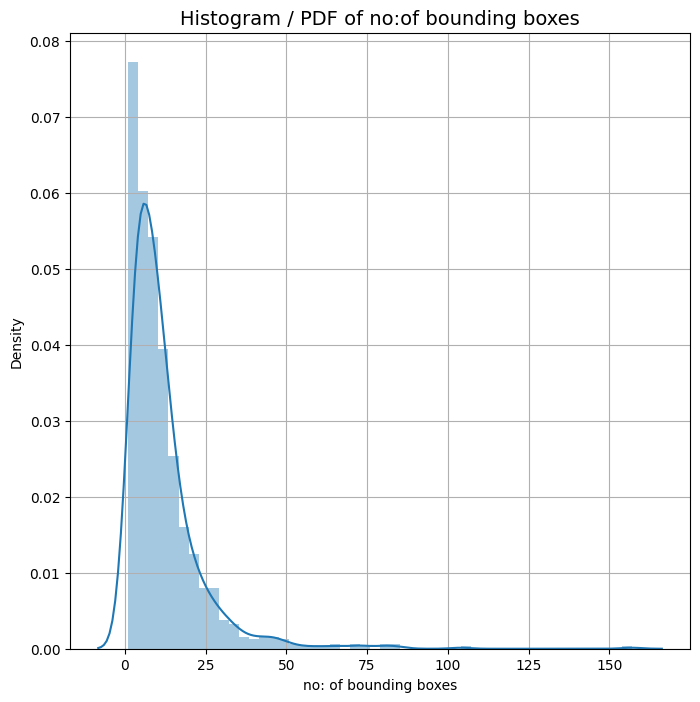

In [ ]:
#plotting PDF of no:of bounding boxes
fig, ax = plt.subplots(figsize=(8,8))
sns.distplot(no_of_bboxes, hist=True, ax=ax)
ax.set_xlabel("no: of bounding boxes")
ax.set_title("Histogram / PDF of no:of bounding boxes",fontsize=14)
ax.grid()
plt.show()

**Observations :**

1) The distribution of no:of bounding boxes per image ranges over 1-159.

2) Most of the images have the 1-25 bounding boxes.

3) Mean of the no:of bounding boxes is approximately 12 

##### **CDF of no:of bounding boxes**

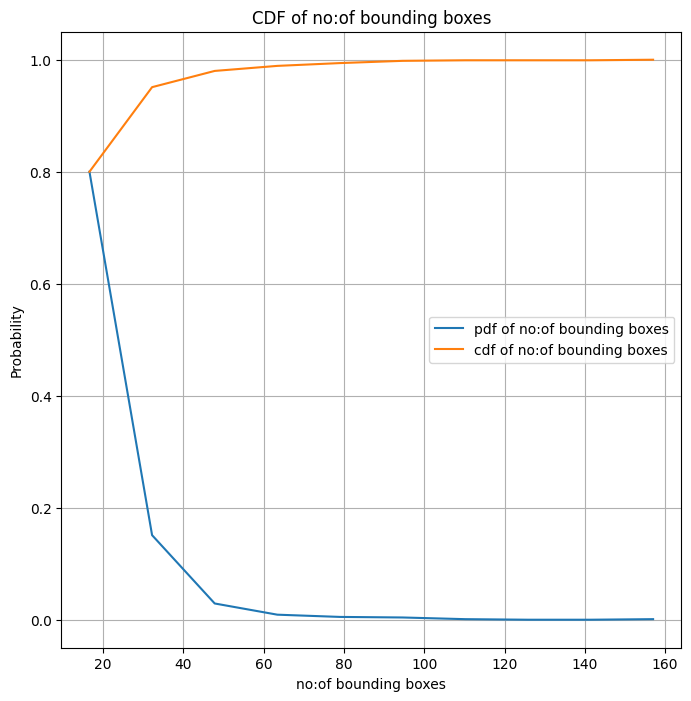

In [ ]:
fig, ax = plt.subplots(figsize=(8,8))
counts, bin_edges = np.histogram(no_of_bboxes, bins=10,density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
ax.plot(bin_edges[1:],pdf,label="pdf of no:of bounding boxes")
ax.plot(bin_edges[1:], cdf,label="cdf of no:of bounding boxes")
ax.set_xlabel("no:of bounding boxes")
ax.set_ylabel("Probability")
ax.set_title("CDF of no:of bounding boxes")
ax.grid()
ax.legend()
plt.show()


**Observation :**

1) More than 80% of the images contains 20 bounding boxes.

2) More than 95% of the images contains 40 bounding boxes.

##### **Count of Bounding Boxes Vs No: of Images**

In [ ]:
uniq_bbox, img_counts = np.unique(no_of_bboxes, return_counts=True)
pd.DataFrame(data=np.array([uniq_bbox,img_counts]).T,columns=['No:of bounding box','No:of Images'])

,No:of bounding box,No:of Images
0,1,33
1,2,54
2,3,61
3,4,93
4,5,68
...,...,...
57,80,1
58,83,1
59,85,1
60,104,1


**Observations**

1) Total of 62 different combinations are found.

2) There are only a single images with  bounding boxes 80-157.

##### **PDF of BBox Width & Height**

In [ ]:
#calculating the bounding box width & height using bbox co-ordinates
width=[]
height=[]
for row in tqdm(icdar15_gt_df['BBox'].values):
    w=[]
    h=[]
    for bb in row:
        w1=np.linalg.norm(bb[0] - bb[1])
        h1=np.linalg.norm(bb[1] - bb[2])
        w.append(w1)
        h.append(h1)
    w=np.array(w)
    h=np.array(h)
    width.append(w)
    height.append(h)
width=np.array(width)
height=np.array(height)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
#storing the bbox width and height in ground truth data-frame
icdar15_gt_df['BBox_Width']=width
icdar15_gt_df['BBox_Height']=height

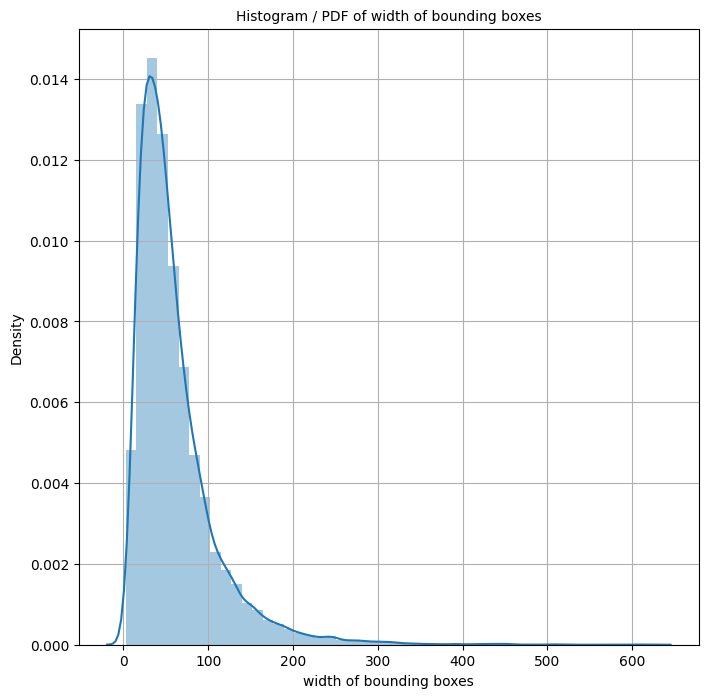

In [ ]:
#plotting PDF of bounding box width.
fig, ax = plt.subplots(figsize=(8,8))

sns.distplot(np.hstack(icdar15_gt_df['BBox_Width'].values), hist=True, ax=ax)
ax.set_xlabel("width of bounding boxes")
ax.set_title("Histogram / PDF of width of bounding boxes",fontsize=10)
ax.grid()

plt.show()

**Observations :**

1) Most of the bounding box width ranges in 20-100.

2) There are few bounding boxes with width more than 200

3) Average width of the bounding boxes is approximately 60.

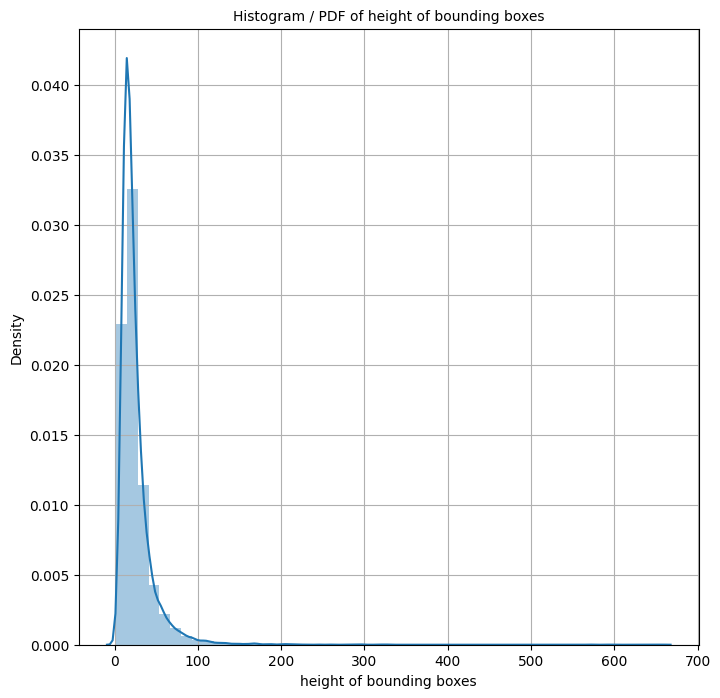

In [ ]:
fig, ax = plt.subplots(figsize=(8,8))

sns.distplot(np.hstack(icdar15_gt_df['BBox_Height'].values), hist=True, ax=ax)
ax.set_xlabel("height of bounding boxes")
ax.set_title("Histogram / PDF of height of bounding boxes",fontsize=10)
ax.grid()

plt.show()

**Observations :**

1) Most of the bounding box height ranges in 10-70.

2) There are few bounding boxes with height more than 100

3) Average height of the bounding boxes is approximately 50.

In [ ]:
#merging ICDAR-15 processed image details & ground truth in a single data-frame 
icdar15_total= pd.merge(icdar15_img_details_df, icdar15_gt_df, 
                        on="Image",how="inner")
icdar15_total.shape

(1000, 9)

In [ ]:
#sample of total ICDAR-15 dataframe 
icdar15_total.sample(5)

,Image,Width,Height,Size in KB,Ground_Truth,BBox,Text,BBox_Width,BBox_Height
671,img_672.jpg,720,1280,101.620117,gt_img_672.txt,"[[[48.0, 558.0], [106.0, 560.0], [105.0, 581.0...","[###, MARKET, ###, VITALITY, COURT, PODI, ###,...","[58.034472514187634, 195.4328529188478, 92.779...","[21.02379604162864, 63.071388124885914, 65.0, ..."
415,img_416.jpg,720,1280,109.000977,gt_img_416.txt,"[[[565.0, 181.0], [601.0, 180.0], [601.0, 212....","[###, ###, ###, ###, ###, ###, ###, ###, save,...","[36.013886210738214, 23.021728866442675, 41.01...","[32.0, 21.37755832643195, 35.014282800023196, ..."
949,img_950.jpg,720,1280,98.960938,gt_img_950.txt,"[[[38.0, 489.0], [102.0, 485.0], [100.0, 513.0...","[CANS, ###, TRAS, RECYCLE, LASTIC, ANS, HERE]","[64.1248781675256, 55.86591089385369, 103.7689...","[28.071337695236398, 23.259406699226016, 41.23..."
186,img_187.jpg,720,1280,140.225586,gt_img_187.txt,"[[[328.0, 230.0], [533.0, 226.0], [535.0, 264....","[INSEAD, The, ###, School, ###, ###, World]","[205.03902067655318, 28.0178514522438, 53.0, 4...","[38.05259518088089, 12.041594578792296, 12.0, ..."
845,img_846.jpg,720,1280,93.423828,gt_img_846.txt,"[[[1116.0, 212.0], [1129.0, 213.0], [1130.0, 2...","[###, ###, ORCHARD, ###, ###, ###, EXIT, LOBBY...","[13.038404810405298, 62.03224967708329, 49.040...","[8.06225774829855, 15.297058540778355, 9.05538..."


In [ ]:
#saving the ICDAR-15 total data frame to disk
joblib.dump(icdar15_total,'/content/gdrive/MyDrive/Colab Notebooks/icdar15_gt_df.pkl.gz',compress=('gzip', 3))

['/content/gdrive/MyDrive/Colab Notebooks/icdar15_gt_df.pkl.gz']

## Vizualization

In [ ]:
def extract_images_from_zip_file(file_name,files_to_be_extracted):
    """function to extract required files from the zip file"""
    zpfile=ZipFile(file_name,'r')
    for f in files_to_be_extracted:
        zpfile.extract(f)
    zpfile.close()

In [ ]:
def display_images_with_bounding_box(images,bounding_boxes):
    """function to display original Vs image with bounding-box around the
    text labels present in the image"""
    fig,axes=plt.subplots(2,len(images),figsize=(20,12))
    axes=axes.flatten()
    ax_idx=0    
    for count in range(2):
        for img,bbx in zip(images,bounding_boxes):
            axes[ax_idx].set_title("Original Image")
            i = cv2.imread(img, cv2.IMREAD_COLOR)
            i = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
            if (count ==1):
                for bb in bbx:
                    bbox = patches.Polygon(bb,linewidth=2,edgecolor='green',facecolor='none')
                    axes[ax_idx].add_patch(bbox)
                axes[ax_idx].set_title("With bounding-boxes")            
            axes[ax_idx].imshow(i)
            ax_idx+=1
    plt.show()

In [ ]:
def remove_files(files_to_be_removed):
    """function to delete files after processing"""
    for i in files_to_be_removed:
        os.remove(i)

### ICDAR-15

In [ ]:
#loading the saved icdar-15 pre-processed data-frame
icdar15_total=joblib.load('/content/gdrive/MyDrive/Colab Notebooks/icdar15_gt_df.pkl.gz')

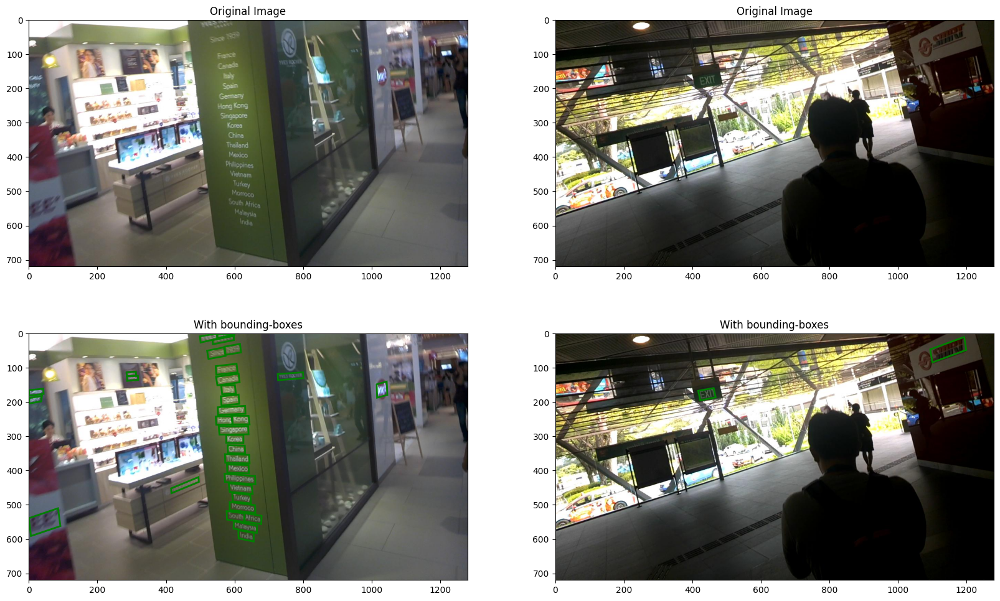

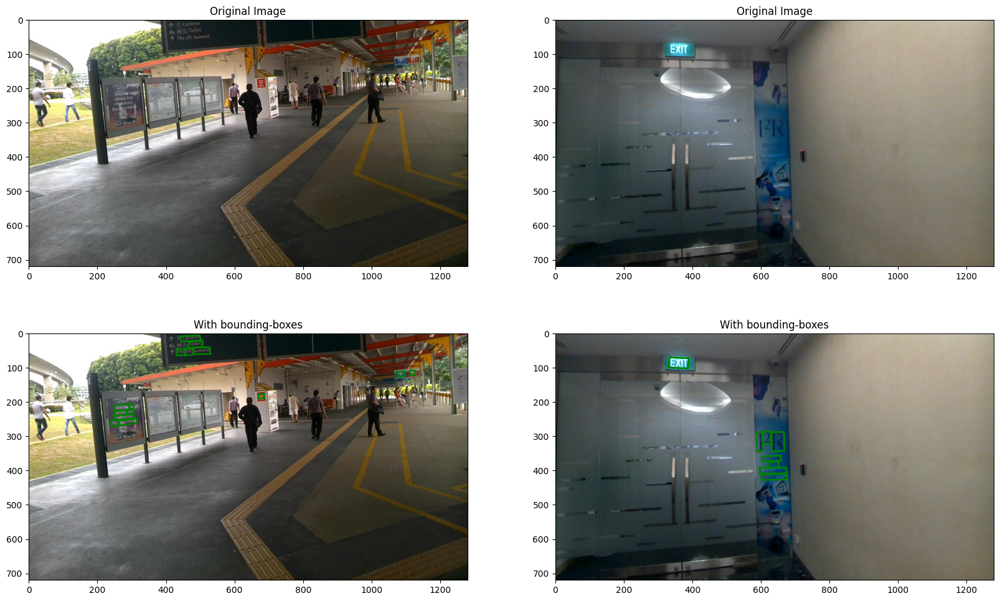

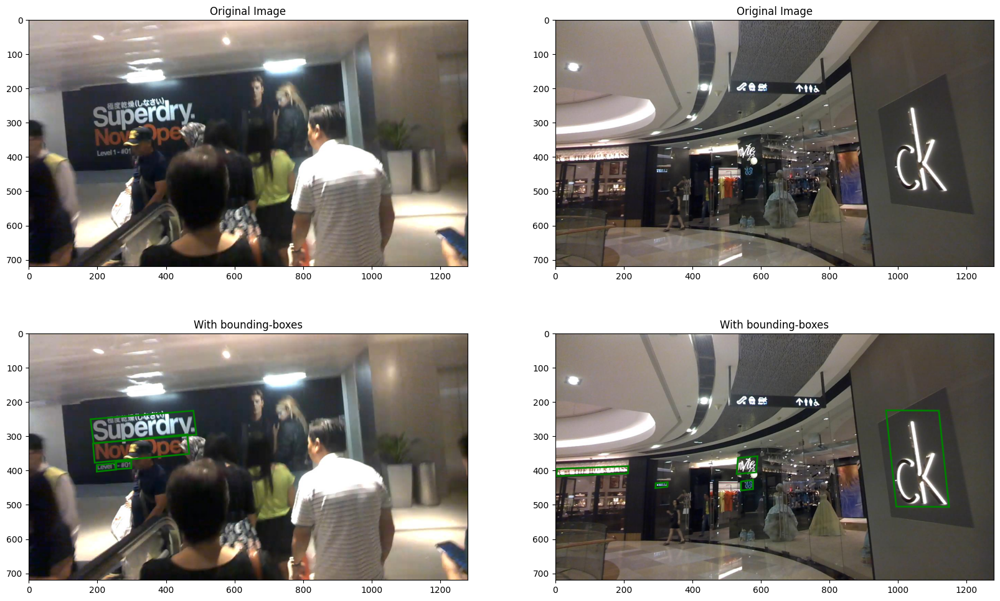

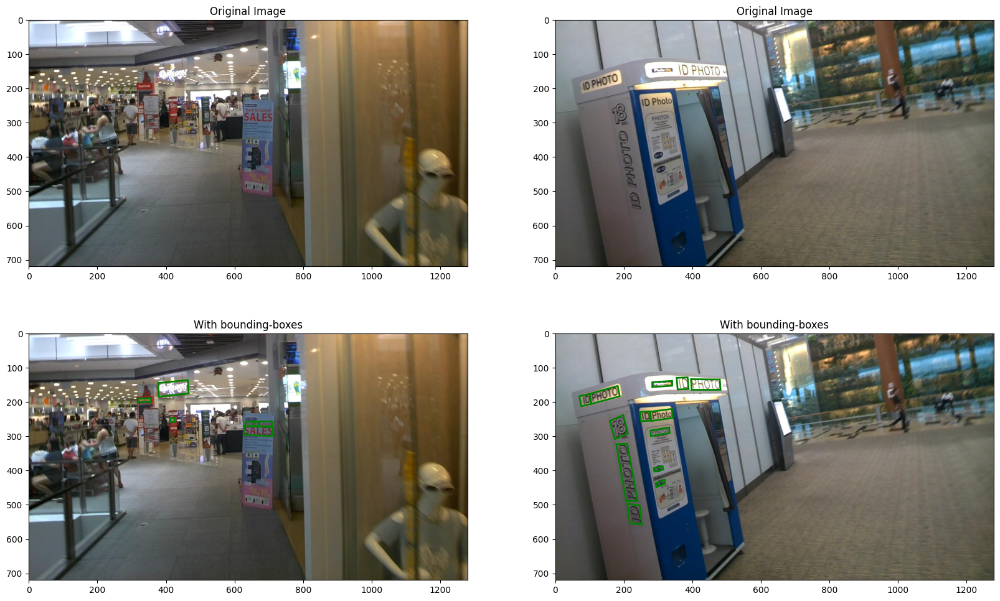

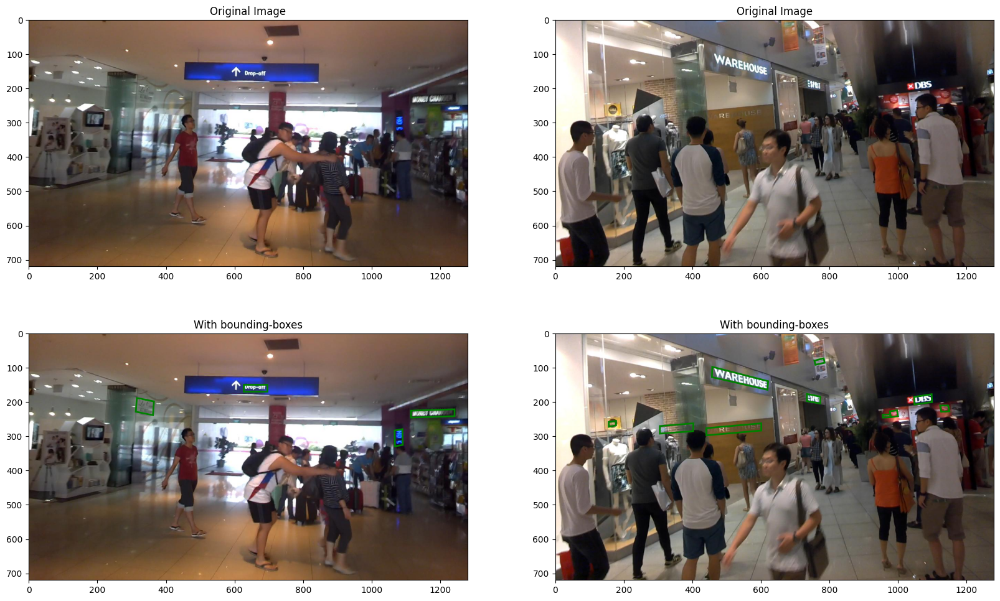

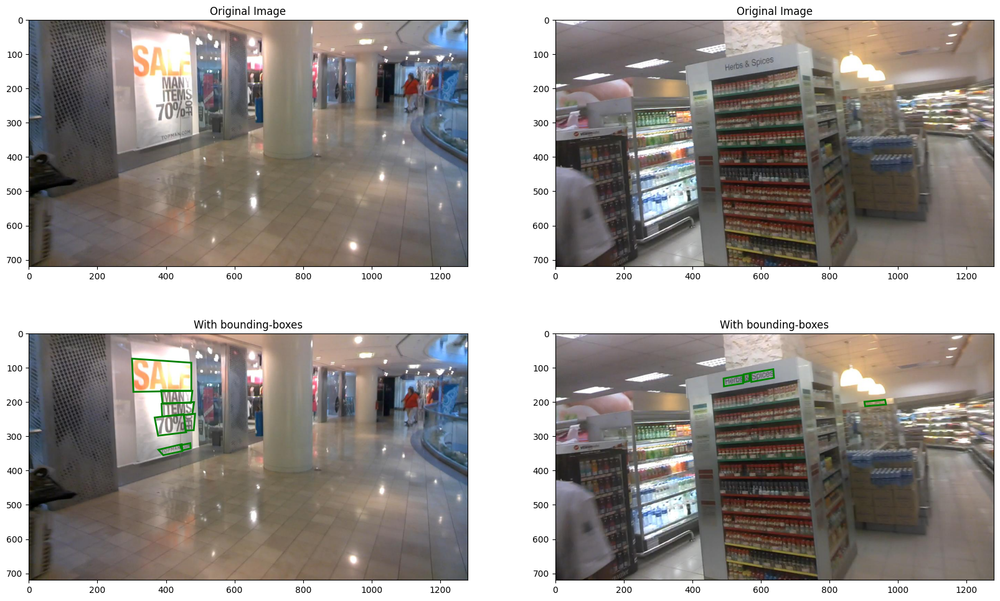

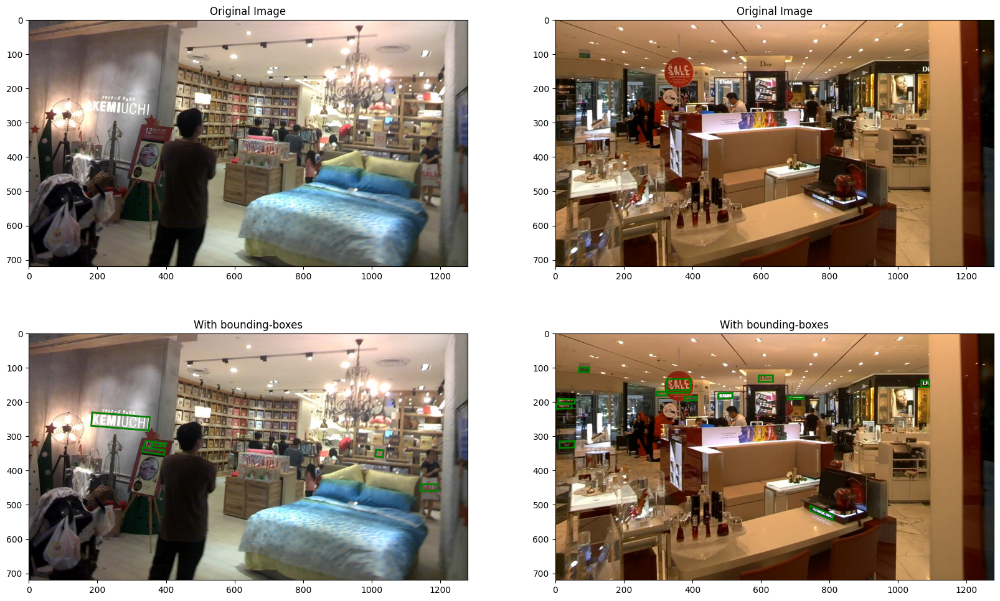

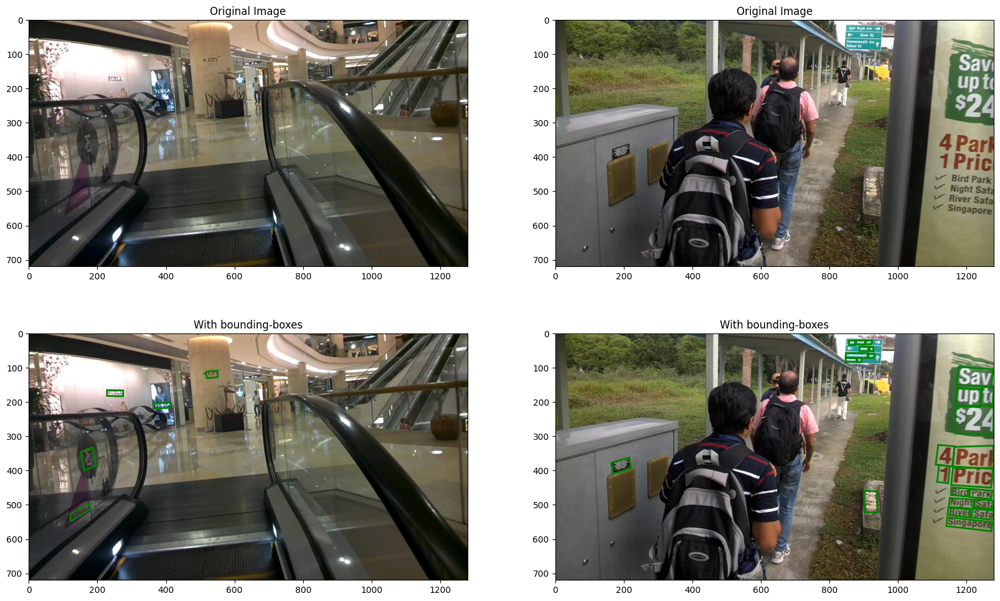

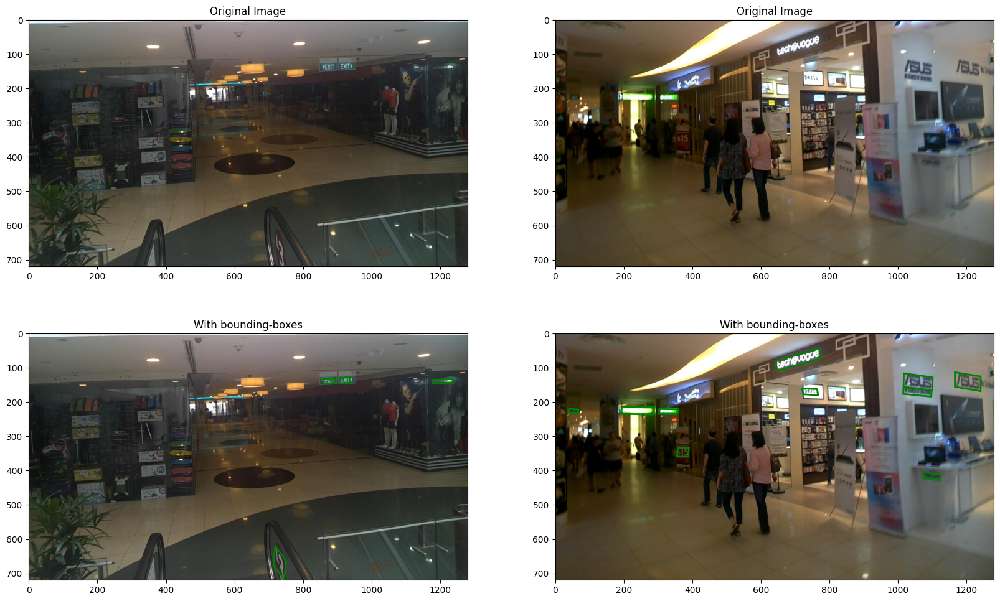

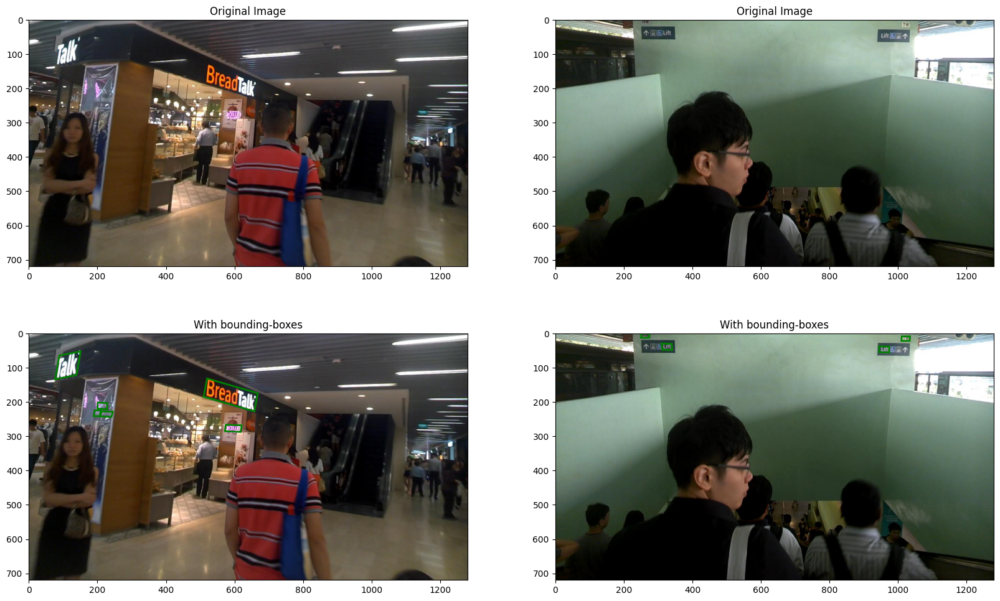

In [ ]:
#visualizing random 20 images with & with out bounding boxes
for i in range(10):
    samples=icdar15_total.sample(2)
    img_zip_file="/content/ch4_training_images.zip"
    images=samples['Image'].values
    bboxes=samples['BBox'].values
    extract_images_from_zip_file(img_zip_file,images)
    display_images_with_bounding_box(images,bboxes)
    remove_files(images)